<a href="https://colab.research.google.com/github/oshodiS/AII/blob/main/IPCV_assignment_module_one.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Product Recognition of Food Products**

## Image Processing and Computer Vision - Assignment Module \#1


Contacts:

- Prof. Giuseppe Lisanti -> giuseppe.lisanti@unibo.it
- Prof. Samuele Salti -> samuele.salti@unibo.it
- Alex Costanzino -> alex.costanzino@unibo.it
- Francesco Ballerini -> francesco.ballerini4@unibo.it


Computer vision-based object detection techniques can be applied in super market settings to build a system that can identify products on store shelves.
An example of how this system could be used would be to assist visually impaired customers or automate common store management tasks like detecting low-stock or misplaced products, given an image of a shelf in a store.

## Task
Develop a computer vision system that, given a reference image for each product, is able to identify such product from one picture of a store shelf.

<figure>
<a href="https://imgbb.com/">
  <center>
  <img src="https://i.ibb.co/TwkMWnH/Screenshot-2024-04-04-at-14-54-51.png" alt="Screenshot-2024-04-04-at-14-54-51" border="0" width="300" />
</a>
</figure>

For each type of product displayed in the
shelf the system should report:
1. Number of instances;
1. Dimension of each instance (width and height in pixel of the bounding box that enclose them);
1. Position in the image reference system of each instance (center of the bounding box that enclose them).

#### Example of expected output
```
Product 0 - 2 instance found:
  Instance 1 {position: (256, 328), width: 57px, height: 80px}
  Instance 2 {position: (311, 328), width: 57px, height: 80px}
Product 1 – 1 instance found:
.
.
.
```

### Track A - Single Instance Detection
Develop an object detection system to identify single instance of products given one reference image for each item and a scene image.

The system should be able to correctly identify all the product in the shelves
image.

### Track B - Multiple Instances Detection
In addition to what achieved at step A, the system should also be able to detect multiple instances of the same product.

## Data
Two folders of images are provided:
* **Models**: contains one reference image for each product that the system should be able to identify.
* **Scenes**: contains different shelve pictures to test the developed algorithm in different scenarios. The images contained in this folder are corrupted by noise.

#### Track A - Single Instance Detection
* **Models**: {ref1.png to ref14.png}.
* **Scenes**: {scene1.png to scene5.png}.

#### Track B - Multiple Instances Detection
* **Models**: {ref15.png to ref27.png}.
* **Scenes**: {scene6.png to scene12.png}.

In [22]:
from google.colab import drive
drive.mount('/content/drive')

!cp -r /content/drive/MyDrive/AssignmentsIPCV/dataset.zip ./
!unzip dataset.zip

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Archive:  dataset.zip
replace __MACOSX/._dataset? [y]es, [n]o, [A]ll, [N]one, [r]ename: 

In [23]:
import numpy as np
import os
import cv2
from matplotlib import pyplot as plt
import re
from google.colab.patches import cv2_imshow


## 1. Load Dataset

In [24]:
def load_images_from_folder(folder_path):
  """
    returns a dictionary id_image: image
  """
  images = {}
  for filename in os.listdir(folder_path):
        if filename.endswith(".jpg") or filename.endswith(".png"):
            image_path = os.path.join(folder_path, filename)
            try:
                img = cv2.imread(image_path,cv2.COLOR_BGR2RGB )
                id = int(re.findall(r'\d+', filename)[0])
                images[id] = img
            except Exception as e:
                print(f"Error loading image {filename}: {e}")
  return images

The dataset contains  12 train images
Train image example 



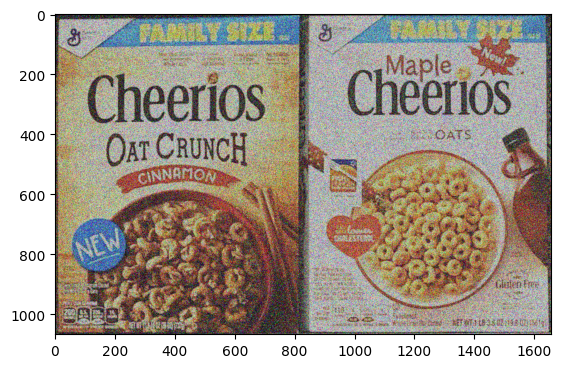


 The dataset contains  27 query images
Query image example 



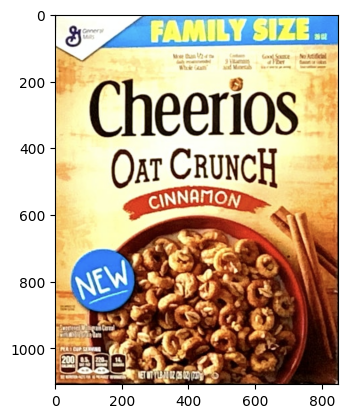

In [25]:
scenes = load_images_from_folder("dataset/scenes")
print("The dataset contains ", len(scenes.keys()), "train images")
print("Train image example \n")
plt.imshow(cv2.cvtColor(scenes[1], cv2.COLOR_BGR2RGB)) #example
plt.show()

models = load_images_from_folder("dataset/models")
print("\n The dataset contains ", len(models.keys()), "query images")
print("Query image example \n")

plt.imshow(cv2.cvtColor(models[1], cv2.COLOR_BGR2RGB)) #example
plt.show()


## 2. Filtering

In [26]:
def compare_denoised_img(original, denoised):
  print("\n Image with noise")
  plt.imshow(cv2.cvtColor(original, cv2.COLOR_BGR2RGB))
  plt.show()
  print("\n Image without noise")
  plt.imshow(cv2.cvtColor(denoised, cv2.COLOR_BGR2RGB))
  plt.show()

In [27]:
# denoised_scenes = {}
# for  k in scenes.keys():
#   b, g, r = cv2.split(scenes[k])

#   denoised_b = cv2.fastNlMeansDenoising(b, None, h=50, templateWindowSize=3, searchWindowSize=20)
#   denoised_g = cv2.fastNlMeansDenoising(g, None, h=50, templateWindowSize=3, searchWindowSize=20)
#   denoised_r = cv2.fastNlMeansDenoising(r, None, h=50, templateWindowSize=3, searchWindowSize=20)

#   denoised_image = cv2.merge([denoised_r, denoised_g, denoised_r])
#   denoised_scenes[k] = denoised_image


### 2.1 Non local means filter

In [28]:
def apply_median_filter(img, k):
  b, g, r = cv2.split(img)
  median_denoised_r = cv2.medianBlur(r, ksize = k)
  median_denoised_g = cv2.medianBlur(g, ksize = k)
  median_denoised_b = cv2.medianBlur(b, ksize = k)
  median_denoised_image = cv2.merge([median_denoised_r, median_denoised_g, median_denoised_b])
  return median_denoised_image

def denoise_image(img):
  denoised_img = apply_median_filter(img,1)


  denoised_img = apply_median_filter(denoised_img,3)
  denoised_img = apply_median_filter(denoised_img,5)
  denoised_img = apply_median_filter(denoised_img,5)
  denoised_img = apply_median_filter(denoised_img,1)
  denoised_img = apply_median_filter(denoised_img,3)
  denoised_img = apply_median_filter(denoised_img,3)
  denoised_img = apply_median_filter(denoised_img,1)
  return denoised_img




In [29]:
denoised_scenes = {}
for  k in scenes.keys():
  denoised_scenes[k] = denoise_image(scenes[k])




 Image with noise


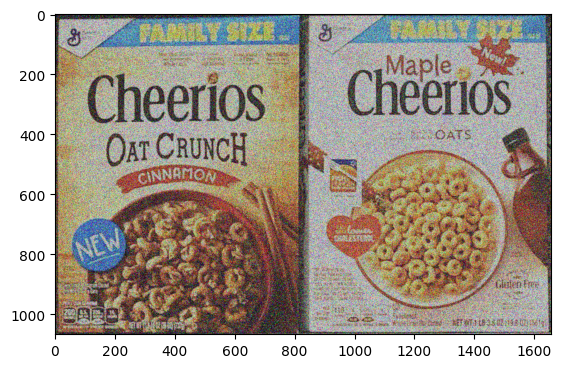


 Image without noise


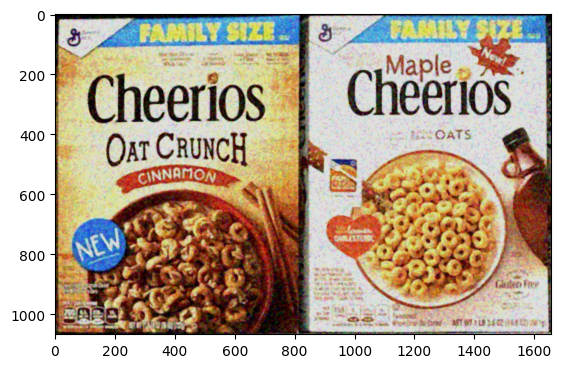

In [30]:
compare_denoised_img(scenes[1], denoised_scenes[1])

## 3. Single Instance Detection

In [31]:
models_idx = [i for i in range(1, 15)]
scenes_idx =   [i for i in range(1, 6)]

### 3.1 SIFT

In [32]:
def find_matches(des_query, des_train):
  FLANN_INDEX_KDTREE = 1
  index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
  search_params = dict(checks = 50)
  flann = cv2.FlannBasedMatcher(index_params, search_params)
  matches = flann.knnMatch(des_query,des_train,k=2)
  return matches



In [33]:
MIN_MATCH_COUNT = 15

In [34]:
def get_ROI(dst,train_img):
    center_x = np.mean(dst[:, 0, 0])
    center_y = np.mean(dst[:, 0, 1])
    center = (center_x, center_y)

    x_min = int(min((dst[0,0,0] + dst[1,0,0]) / 2, 0))
    y_min = int(max((dst[0,0,1] + dst[3,0,1]) / 2, 0))
    x_max = int(min((dst[2,0,0] + dst[3,0,0]) / 2, train_img.shape[1]))
    y_max = int(min((dst[1,0,1] + dst[2,0,1]) / 2, train_img.shape[0]))
    return center, x_min, y_min, x_max, y_max


In [35]:
COLOR_T = 200

In [36]:
from shapely.geometry import Polygon


In [37]:
def is_rectangle(bbox, max_distortion):
    polygon = Polygon(np.asarray(bbox)[:, 0, :])
    if not polygon.is_valid:
        return False

    def get_bbox_edges(bbox):
        # Extract the lengths of the edges
        lengths = [np.linalg.norm(bbox[i] - bbox[(i + 1) % 4]) for i in range(4)]
        return lengths

    def get_bbox_diagonals(bbox):
        # Extract the lengths of the diagonals
        diagonal1 = np.linalg.norm(bbox[0] - bbox[2])
        diagonal2 = np.linalg.norm(bbox[1] - bbox[3])
        return diagonal1, diagonal2

    # Calculate the edges and diagonals
    edges = get_bbox_edges(bbox)
    diagonal1, diagonal2 = get_bbox_diagonals(bbox)

    # Check validity based on distortion
    valid_diagonal = diagonal1 / diagonal2 <= max_distortion
    valid_edges1 = max(edges[0], edges[2]) / min(edges[0], edges[2]) <= max_distortion
    valid_edges2 = max(edges[1], edges[3]) / min(edges[1], edges[3]) <= max_distortion

    return valid_diagonal and valid_edges1 and valid_edges2

In [38]:
sift = cv2.xfeatures2d.SIFT_create()
#keypoints and descriptors
kd_queries = {}
kd_trains = {}

for id in scenes_idx:
  #(keypoint, descriptor)
  kd_trains[id] = (sift.detectAndCompute(denoised_scenes[id], None))

for id in models_idx:
  #(keypoint, descriptor)
  kd_queries[id] = (sift.detectAndCompute(models[id], None))

found = {}
for j in scenes_idx:
  object_found = {}
  for i in models_idx: #
    kp_query = kd_queries[i][0]
    kp_train = kd_trains[j][0]
    matches = find_matches( kd_queries[i][1], kd_trains[j][1])
    good = []
    for m,n in matches:
        if m.distance < 0.65*n.distance:
            good.append(m)

    if len(good) > MIN_MATCH_COUNT:

      src_pts = np.float32([ kp_query[m.queryIdx].pt for m in good ]).reshape(-1,1,2)
      dst_pts = np.float32([ kp_train[m.trainIdx].pt for m in good ]).reshape(-1,1,2)
      M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)
      matchesMask = mask.ravel().tolist()
      h,w = models[i].shape[:2]
      pts = np.float32([ [0,0],[0,h-1],[w-1,h-1],[w-1,0] ]).reshape(-1,1,2)
      # Projecting the corners into the train image
      dst = cv2.perspectiveTransform(pts,M)




      #filter matches
      #define the ROI
      center, x_min, y_min, x_max, y_max = get_ROI(dst, models[i])
      train_window = denoised_scenes[j][y_min:y_max, x_min:x_max]


      #query_color = np.mean(np.mean(models[i], axis=0), axis=0)
      #train_color = np.mean(np.mean(denoised_scenes[j][y_min:y_max, x_min:x_max], axis=0), axis=0)
      #color_diff = np.linalg.norm(query_color - train_color)


      #if color diff below the threshold
      if(is_rectangle(dst,1.4)):
          object_found[i] = dst


      #else:
       # print(color_diff)
    else:
      matchesMask = None
  found[j] = object_found






In [39]:
object_found

{11: array([[[ 184.78801,  475.68347]],
 
        [[ 186.34358, 1028.4316 ]],
 
        [[ 552.6555 , 1028.281  ]],
 
        [[ 551.3427 ,  475.36932]]], dtype=float32),
 12: array([[[ 498.3226 ,  422.89252]],
 
        [[ 497.0675 , 1060.7396 ]],
 
        [[ 927.99695, 1065.0104 ]],
 
        [[ 935.05817,  408.03586]]], dtype=float32)}

In [40]:
def get_dominant_color_hsv(im):
    '''
    Return the dominant color in HSV space of an input RGB image.
    '''

    c = np.mean(im, axis=(0, 1)).astype(np.uint8)
    c = cv2.cvtColor(c.reshape(1, 1, 3), cv2.COLOR_RGB2HSV).reshape(3)

    h = (c[0]*2) * np.pi / 180
    s = c[1] / 255
    v = c[2] / 255

    return h, s, v


def color_distance(im1, im2):
    '''
    Calculate the color distance between 2 images.
    The color distance is computed by finding the average RGB color of each image
    and by finding the distance of the two colors in HSV space.

    Parameters
    ----------
    im1 : array
        RGB image
    im2 : array
        RGB image

    Returns
    -------
    distance : float
    '''
    h1, s1, v1 = get_dominant_color_hsv(im1)
    h2, s2, v2 = get_dominant_color_hsv(im2)

    distances = (np.sin(h1)*s1*v1 - np.sin(h2)*s2*v2)**2 + \
        (np.cos(h1)*s1*v1 - np.cos(h2)*s2*v2)**2 + (v1 - v2)**2

    return distances * 100

In [41]:
def draw_image(denoised_scenes, found_matches, i ):
  for j in found_matches[i].keys():
     dst = found_matches[i][j]
     cv2.polylines(denoised_scenes[i], [np.int32(dst)], True, (0,255,0), 3, cv2.LINE_AA)
     dst = dst.reshape(4, 2)
     centroid = np.mean(dst, axis=0, dtype=np.int32)


     font_scale = 1
     font_thickness = 3
     text = "Ref " + str(j)
     font_color = (0,255,0)
     text_size = cv2.getTextSize(text,  cv2.FONT_HERSHEY_SIMPLEX, font_scale, font_thickness)[0]
     text_origin = (centroid[0] - text_size[0] // 2, centroid[1] + text_size[1] // 2)
     cv2.putText(denoised_scenes[i], text, text_origin, cv2.FONT_HERSHEY_SIMPLEX, font_scale, font_color, font_thickness, cv2.LINE_AA)


  cv2_imshow(denoised_scenes[i])
  cv2.waitKey(0)
  cv2.destroyAllWindows()



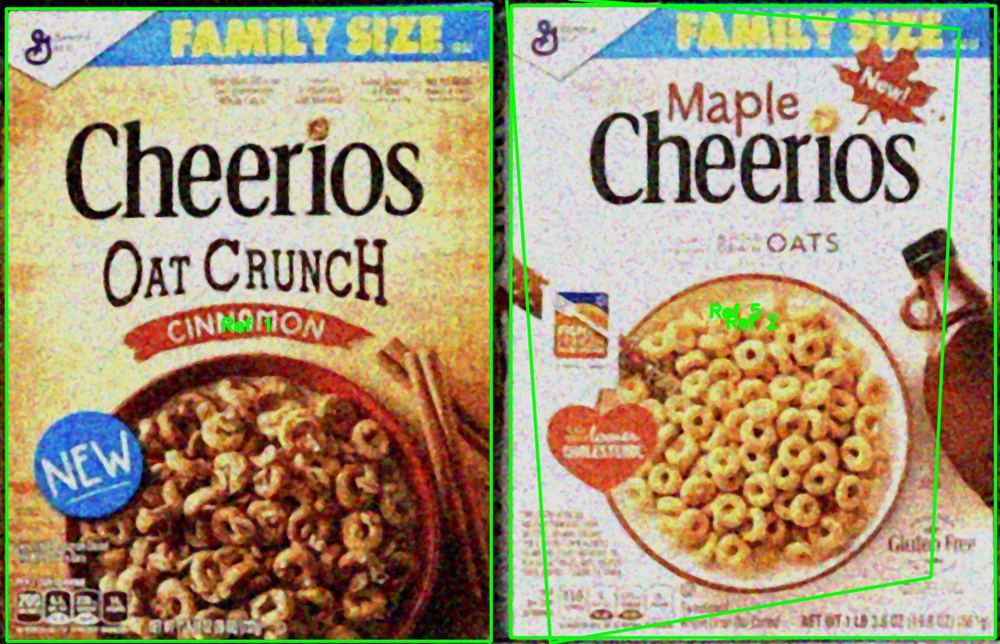

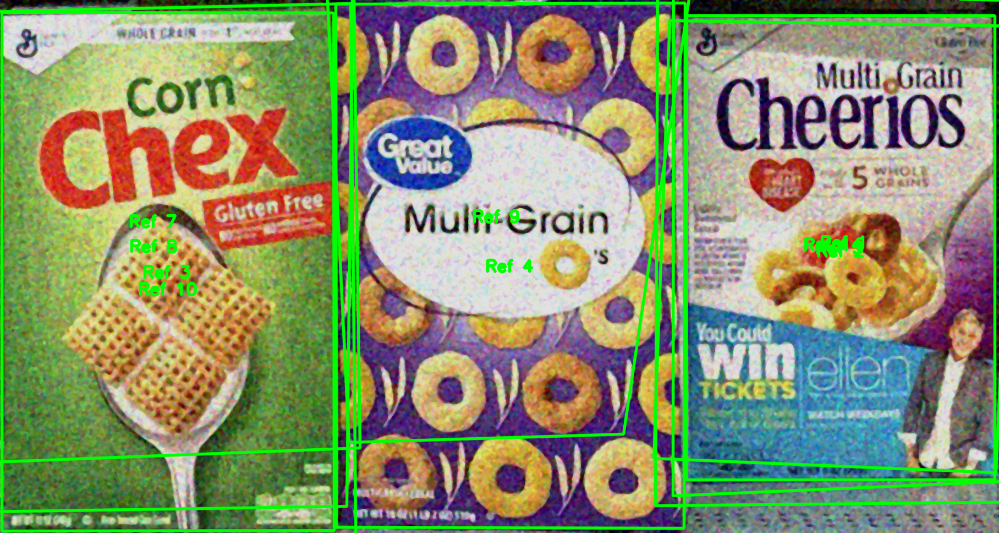

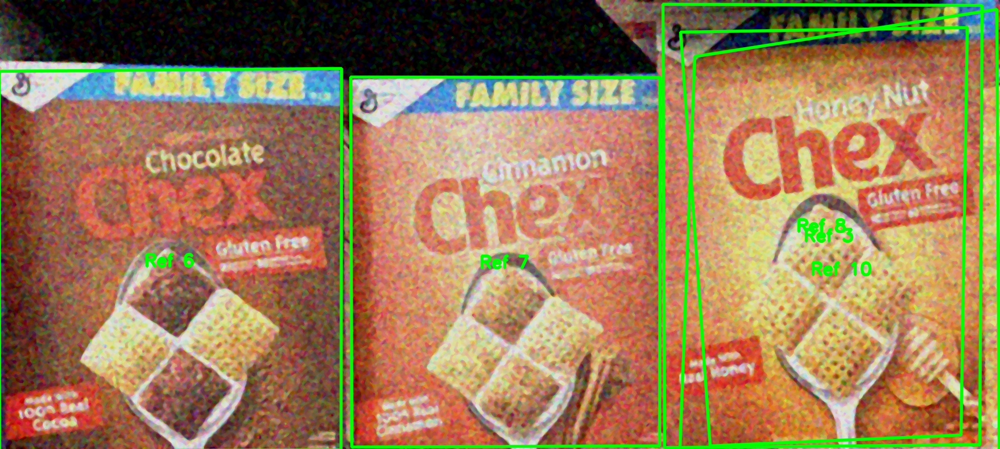

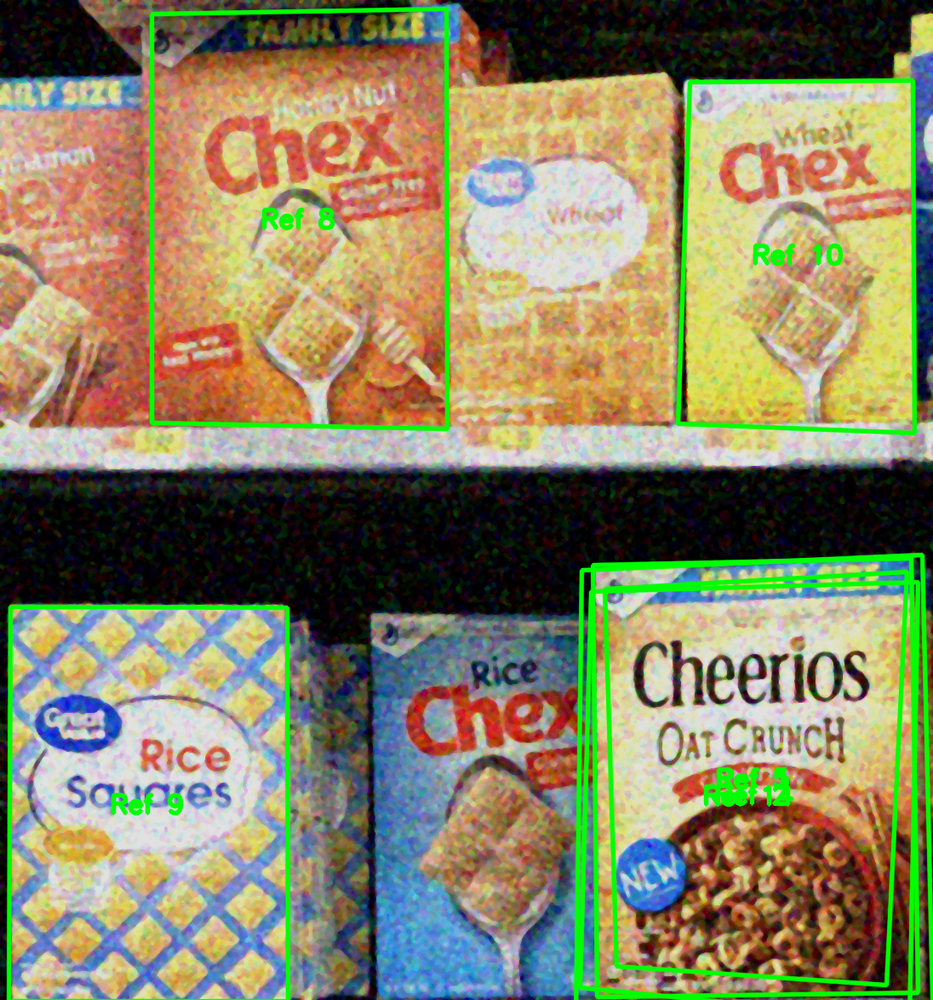

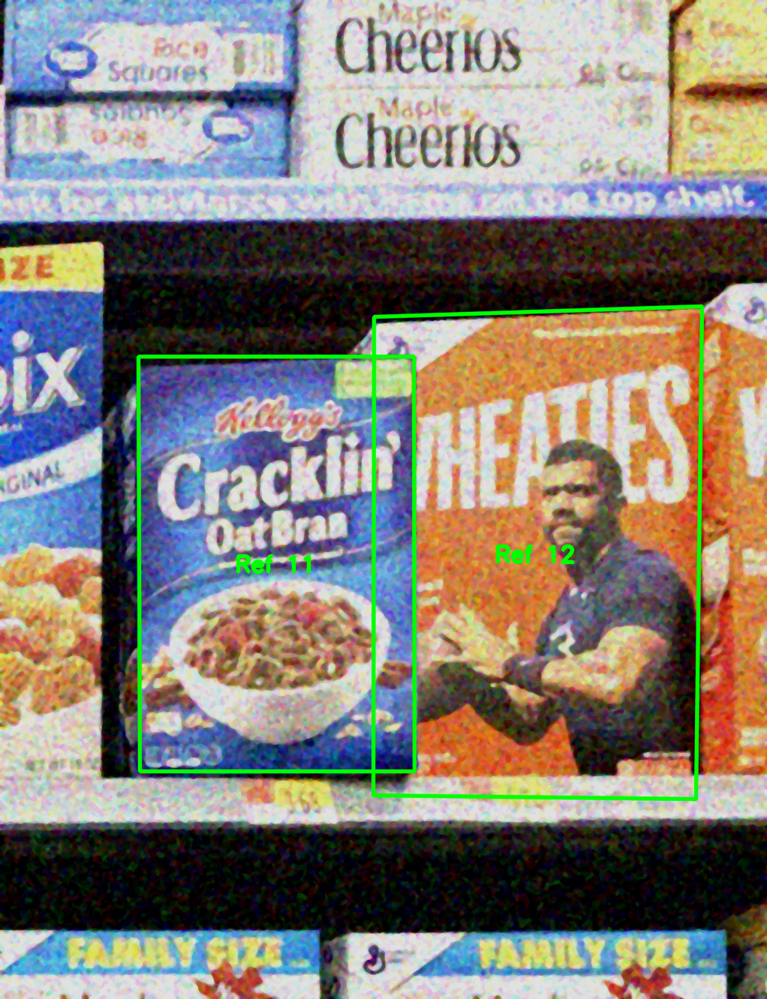

In [42]:
for i in range(1,6):
  draw_image(denoised_scenes, found, i)

## 4. Multiple Instance Detection